In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#
import os
from os import listdir
from os.path import isfile, join
from matplotlib import pyplot as plt
import scipy.io.wavfile as wav
import numpy as np
from keras.preprocessing import image

In [ ]:
import matplotlib.pyplot as plt
from scipy.io import wavfile as wav

def wav_to_spectrogram(audio_path, save_path, spectrogram_dimensions=(64, 64), noverlap=16, cmap='gray_r'):
    sample_rate, samples = wav.read(audio_path)
    if samples.ndim > 1:
        samples = samples.mean(axis=1)  # convert to mono
    fig = plt.figure()
    fig.set_size_inches((spectrogram_dimensions[0]/fig.get_dpi(), spectrogram_dimensions[1]/fig.get_dpi()))
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.specgram(samples, cmap=cmap, Fs=sample_rate, noverlap=noverlap)
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())
    fig.savefig(save_path, bbox_inches="tight", pad_inches=0)

In [ ]:
def dir_to_spectrogram(audio_dir, spectrogram_dir, spectrogram_dimensions=(64, 64), noverlap=16, cmap='gray_r'):
  file_names = [f for f in listdir(audio_dir) if isfile(join(audio_dir, f)) and '.wav' in f]
  for file_name in file_names:
    print(file_name)
    audio_path = audio_dir + file_name
    spectogram_path = spectrogram_dir + file_name.replace('.wav', '.png')
    wav_to_spectrogram(audio_path, spectogram_path, spectrogram_dimensions=spectrogram_dimensions, noverlap=noverlap, cmap=cmap)


एक_jitendra_173.wav


<ipython-input-3-d742c3025381>:5: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, samples = wav.read(audio_path)


चार_ritu_108.wav
चार_HarshVarshney_166.wav
एक_Jagrit_86.wav
चार_Akriti_138.wav
एक_kamran_16.wav
चार_sambhav_196.wav
चार_Harsh_167.wav
चार_Simran_121.wav
चार_Pankaj_188.wav
चार_aadi_132.wav
चार_shweta_206.wav
चार_shweta_120.wav
एक_Harsh_168.wav
चार_dharmendra_161.wav
चार_Ankitkumar_140.wav
चार_Pankaj_102.wav
चार_Neeraj_186.wav
चार_sambhav_110.wav
एक_Divya_166.wav
चार_sachin_37.wav


<ipython-input-3-d742c3025381>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:7773: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


एक_Lakshay_94.wav
एक_shivanshu_116.wav
एक_deepanshu counting_74.wav
चार_ritu_194.wav
चार_Neeraj_100.wav
चार_aadi_46.wav
एक_Yousha_217.wav
एक_Shivamkaushik_200.wav
चार_Shivamkaushik_199.wav
चार_Simran_207.wav
एक_ankit_56.wav
एक_Harsh_82.wav
एक_Shubhamkataria_119.wav
चार_manju_20.wav
चार_saumil_111.wav
चार_vishesh_126.wav
चार_Yatin_129.wav
एक_Shubhamkataria_205.wav
एक_shresthi_117.wav
चार_nishant counting_187.wav
चार_saumil_197.wav
एक_shresthi_203.wav
एक_ankit_142.wav
चार_Surbhi_124.wav
एक_prachi_105.wav
चार_aariz_133.wav
एक_prachi_191.wav
एक_shrey_118.wav
एक_shrey_204.wav
चार_Anmolgaur_142.wav
एक_Himanshi_169.wav
एक_Himanshi_83.wav
एक_raj_106.wav
चार_lokesh_94.wav
चार_amal counting_53.wav
एक_raj_192.wav
चार_aariz_47.wav
चार_Poonam_189.wav
एक_chhavi_72.wav
चार_sparsh_208.wav
एक_chhavi_158.wav
चार_Surbhi_210.wav
पाँच_Satish_38.wav
एक_ritu_109.wav
चार_sparsh_122.wav
चार_lokesh_180.wav
चार_Renu_106.wav
चार_Abhishek_0.wav
चार_Renu_192.wav
चार_Aditya rai_136.wav
चार_Himanshi_82.wav
चार_Himans

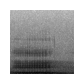

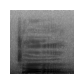

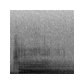

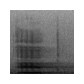

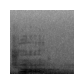

...

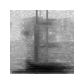

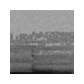

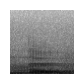

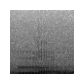

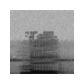

In [ ]:
audio_folder = "/content/drive/MyDrive/RNN/recordings-20240313T155258Z-001/recordings/"
spectrogram_folder ="/content/drive/MyDrive/RNN/spectrogram/"
dir_to_spectrogram(audio_folder, spectrogram_folder)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
#from tensorflow.keras.preprocessing import image
#from keras.utils import to_categorical
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
#from keras.utils.np_utils import to_categorical

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define paths
dataset_folder = "/content/drive/MyDrive/RNN/spectrogram/"
train_folder = "/content/drive/MyDrive/RNN/train/"
test_folder = "/content/drive/MyDrive/RNN/test/"

# Create training and testing folders if they don't exist
os.makedirs(train_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

# List all files in the dataset folder
files = os.listdir(dataset_folder)

# Split the dataset into training and testing sets
train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)

# Move training files to the training folder
for file in train_files:
    shutil.move(os.path.join(dataset_folder, file), os.path.join(train_folder, file))

# Move testing files to the testing folder
for file in test_files:
    shutil.move(os.path.join(dataset_folder, file), os.path.join(test_folder, file))

In [ ]:
trainset= []
train_directory = "/content/drive/MyDrive/RNN/train/"
for file in os.listdir(train_directory):
  labels = file.split('_')[0]
  sample_number = file.split('_')[2]
  img = image.load_img(train_directory+file)
  trainset.append([image.img_to_array(img), labels])

In [ ]:
testset= []
test_directory = "/content/drive/MyDrive/RNN/test/"
for file in os.listdir(test_directory):
  labels = file.split('_')[0]
  sample_number = file.split('_')[2]
  img = image.load_img(test_directory+file)
  testset.append([image.img_to_array(img), labels])

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, SimpleRNN
from tensorflow.keras.models import Model
import numpy as np

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, SimpleRNN
from tensorflow.keras.models import Model
import numpy as np

In [ ]:
# Get only images in the train list, not the labels
X_train = [item[0] for item in trainset]
# Get only labels in the train list, not the images
y_train = [item[1] for item in trainset]
# Get only images in the test list, not the labels
X_test = [item[0] for item in testset]
# Get only labels in the test list, not the images
y_test = [item[1] for item in testset]


In [ ]:
# Convert list to numpy array in order to define input shape
X_train = np.asanyarray(X_train)
y_train = np.asanyarray(y_train)
X_test = np.asanyarray(X_test)
y_test = np.asanyarray(y_test)
print("X_train",X_train.shape)
print("y_train",y_train.shape)
print("X_test",X_test.shape)
print("y_test",y_test.shape)

X_train (1753, 64, 64, 3)
y_train (1753,)
X_test (439, 64, 64, 3)
y_test (439,)


In [ ]:

# # Convert labels to categorical one-hot representation
# y_train = to_categorical(y_train)
# y_test = to_categorical(y_test)

# Convert labels to numerical values
label_to_index = {label: i for i, label in enumerate(set(y_train))}
y_train_numeric = np.array([label_to_index[label] for label in y_train])
y_test_numeric = np.array([label_to_index[label] for label in y_test])

# Convert numerical labels to one-hot encoded vectors
num_classes = len(label_to_index)
y_train= to_categorical(y_train_numeric, num_classes=num_classes)
y_test= to_categorical(y_test_numeric, num_classes=num_classes)

# Normalize the images
X_train /= 255
X_test /= 255

In [ ]:
print(X_train.shape)

(1753, 64, 64, 3)


In [ ]:
# X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], X_train.shape[2]))
# X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2]))

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], X_train.shape[2] * X_train.shape[3]))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2] * X_test.shape[3]))

print(X_train.shape)
print(X_test.shape)

(1753, 64, 192)
(439, 64, 192)


In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
model = Sequential()
model.add(LSTM(64, input_shape=(64, 192)))
model.add(Dense(10, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                65792     
                                                                 
 dense (Dense)               (None, 10)                650       
                                                                 
Total params: 66442 (259.54 KB)
Trainable params: 66442 (259.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='SGD', metrics=['accuracy'])
model.fit(X_train, y_train, batch_size=32, epochs=100, validation_data=(X_test, y_test))


Epoch 1/100
55/55 [==============================] - 7s 80ms/step - loss: 2.3101 - accuracy: 0.1072 - val_loss: 2.3055 - val_accuracy: 0.1002
Epoch 2/100
55/55 [==============================] - 5s 94ms/step - loss: 2.2968 - accuracy: 0.1226 - val_loss: 2.2979 - val_accuracy: 0.1412
Epoch 3/100
55/55 [==============================] - 3s 52ms/step - loss: 2.2904 - accuracy: 0.1546 - val_loss: 2.2946 - val_accuracy: 0.1230
Epoch 4/100
55/55 [==============================] - 3s 51ms/step - loss: 2.2860 - accuracy: 0.1477 - val_loss: 2.2868 - val_accuracy: 0.1549
Epoch 5/100
55/55 [==============================] - 3s 55ms/step - loss: 2.2794 - accuracy: 0.1683 - val_loss: 2.2820 - val_accuracy: 0.1595
Epoch 6/100
55/55 [==============================] - 6s 103ms/step - loss: 2.2741 - accuracy: 0.1877 - val_loss: 2.2749 - val_accuracy: 0.1595
Epoch 7/100
55/55 [==============================] - 3s 61ms/step - loss: 2.2669 - accuracy: 0.1694 - val_loss: 2.2710 - val_accuracy: 0.1686
Epoch

In [ ]:
model.evaluate(X_test, y_test)

14/14 [==============================] - 0s 19ms/step - loss: 0.8856 - accuracy: 0.6856


[0.8856135010719299, 0.6856492161750793]

14/14 [==============================] - 1s 15ms/step


/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 2358 (\N{DEVANAGARI LETTER SHA}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Matplotlib currently does not support Devanagari natively.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 2370 (\N{DEVANAGARI VOWEL SIGN UU}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 2344 (\N{DEVANAGARI LETTER NA}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 2381 (\N{DEVANAGARI SIGN VIRAMA}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 2351 (\N{DEVANAGARI LETTER YA}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/seabo

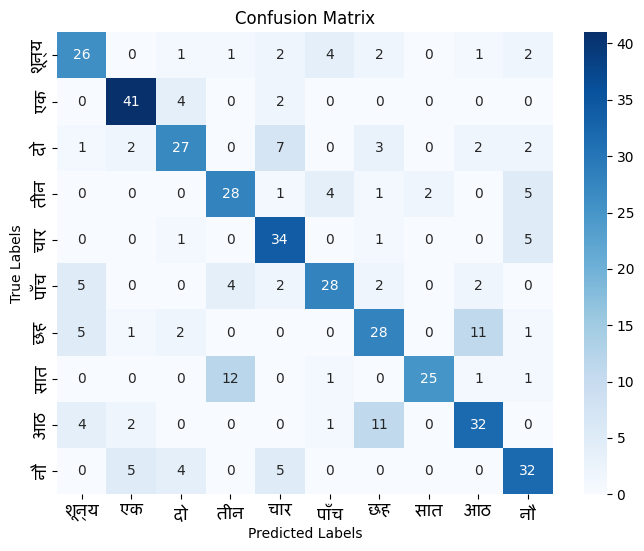

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import tensorflow as tf

from matplotlib.font_manager import FontProperties
from tensorflow import keras
font_prop = FontProperties(fname="/content/drive/MyDrive/RNN/Mangal Regular.ttf", size=12)
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

confusion_mat = confusion_matrix(y_true_classes, y_pred_classes)

class_labels = ["शून्य", "एक", "दो", "तीन", "चार", "पाँच", "छह", "सात", "आठ", "नौ"]

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
# Set font properties for x-axis labels
plt.xticks(fontproperties=font_prop)

# Set font properties for y-axis labels
plt.yticks(fontproperties=font_prop)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Epoch 1/10
55/55 [==============================] - 12s 219ms/step - loss: 0.7064 - accuracy: 0.7633 - val_loss: 0.9421 - val_accuracy: 0.6811
Epoch 2/10
55/55 [==============================] - 8s 150ms/step - loss: 0.6946 - accuracy: 0.7747 - val_loss: 0.7870 - val_accuracy: 0.7631
Epoch 3/10
55/55 [==============================] - 8s 145ms/step - loss: 0.6490 - accuracy: 0.7878 - val_loss: 0.7849 - val_accuracy: 0.7403
Epoch 4/10
55/55 [==============================] - 3s 60ms/step - loss: 0.6446 - accuracy: 0.7935 - val_loss: 0.7860 - val_accuracy: 0.7540
Epoch 5/10
55/55 [==============================] - 3s 55ms/step - loss: 0.6623 - accuracy: 0.7878 - val_loss: 0.8088 - val_accuracy: 0.7244
Epoch 6/10
55/55 [==============================] - 3s 52ms/step - loss: 0.6427 - accuracy: 0.7872 - val_loss: 0.7660 - val_accuracy: 0.7449
Epoch 7/10
55/55 [==============================] - 4s 82ms/step - loss: 0.6364 - accuracy: 0.7918 - val_loss: 0.7584 - val_accuracy: 0.7563
Epoch 8/1

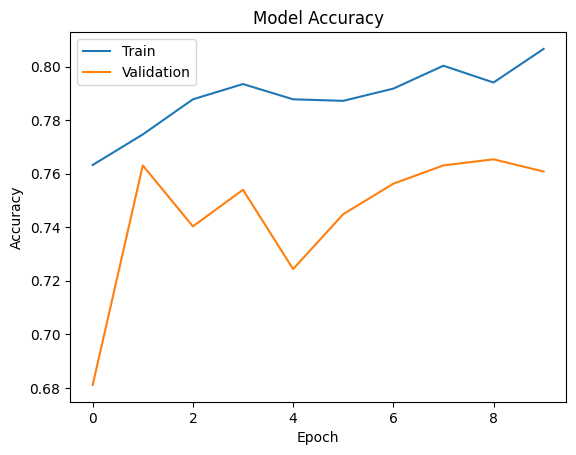

In [ ]:
# Assuming X_train and y_train are your training data
# Assuming model0 is the trained RNN model

history = model.fit(X_train, y_train, batch_size=32, epochs=10, validation_data=(X_test, y_test))

# Plot the accuracy versus epochs graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
import os
from os import listdir
from os.path import isfile, join

In [ ]:
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_by_name(folder_path):
    file_count = {}
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_name = os.path.splitext(file)[1]
            if file_name in file_count:
                file_count[file_name] += 1
            else:
                file_count[file_name] = 1
    return file_count

folder_path = input("Enter folder path: ")
file_count = count_files_by_name(folder_path)
for name, count in file_count.items():
    print(f"Number of files named '{name}': {count}")

Enter folder path: /content/drive/MyDrive/RNN/test
Number of files named '.png': 439


In [ ]:
import os
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

folder_path ="/content/drive/MyDrive/RNN/test/"
prefix = "शून्य_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'शून्य_': 47


In [ ]:
import os

def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

folder_path = "/content/drive/MyDrive/RNN/test/"
prefix = "एक_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'एक_': 50


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix = "दो_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'दो_': 39


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix = "तीन_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'तीन_': 48


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix = "चार_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'चार_': 46


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix =  "पाँच_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'पाँच_': 40


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix = "छह_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'छह_': 44


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix = "सात_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'सात_': 41


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix =  "आठ_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'आठ_': 41


In [ ]:
import os
folder_path= "/content/drive/MyDrive/RNN/test/"
def count_files_with_prefix(folder_path, prefix):
    file_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.startswith(prefix):
                file_count += 1
    return file_count

prefix =  "नौ_"
file_count = count_files_with_prefix(folder_path, prefix)
print(f"Number of files with names starting with '{prefix}': {file_count}")

Number of files with names starting with 'नौ_': 43
